In [1]:
%matplotlib notebook

import os
import glob
from matplotlib import pyplot as plt
from matplotlib import cm,colors
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
import scipy as sp
from scipy.spatial import cKDTree
import pickle

import piff
from piff import Star
import fitsio
from piff.des.decaminfo import DECamInfo

dinfo = DECamInfo()



In [2]:
# recent fit directory from Ares
# imdir = "/nfs/slac/kipac/fs1/g/des/aresh/y1_500_exposure_fit_check_band_i_shape_mode_round2"
imdir = "/nfs/slac/kipac/fs1/g/des/aresh/old_fit_checks_and_other_stuff/fit_checks_round36/dummy/y1_500_exposure_fit_check_band_i_shape_mode_round2"

In [9]:
# npy output files
# seem to have an array of piff.star.Star objects
stars_test = np.load(os.path.join(imdir,"00228724","stars_test_psf_optatmo_opt_only.npy"),allow_pickle=True)


In [13]:
# look at data and fit in a Star object
sd = stars_test[0].data
print("image: ",sd.image)
print("image_pos: ",sd.image_pos)
print("local_wcs: ",sd.local_wcs)
print("weight: ",sd.weight)
print("field_pos: ",sd.field_pos)
print("pixel_area: ",sd.pixel_area)
print("properties: ",sd.properties)


image:  galsim.Image(bounds=galsim.BoundsI(774,792,762,780), wcs=pixmappy.GalSimWCS(file_name='/nfs/slac/g/ki/ki19/des/cpd/y3_piff/astro/zone176.astro', origin=galsim.PositionD(x=0.0, y=0.0), default_color=0), dtype=numpy.float32)
image_pos:  galsim.PositionD(782.8690366437461,770.9272077266166)
local_wcs:  galsim.JacobianWCS(0.003589952949504877, -0.26199411671430656, -0.2623220335383689, -0.00291763030696583)
weight:  galsim.Image(bounds=galsim.BoundsI(774,792,762,780), scale=1.0, dtype=numpy.float64)
field_pos:  galsim.PositionD(1445.6131053799804,3323.292396580774)
pixel_area:  0.06873730362711172
properties:  {'chipnum': 1, 'gain': 1.0, 'sky': 0.0, 'snr': 100.0, 'ra': 21.98478363025329, 'dec': -53.479175271844085, 'x': 782.8690366437461, 'y': 770.9272077266166, 'u': 1445.6131053799804, 'v': 3323.292396580774, 'shape': array([ 9.81594023e+03, -5.63329306e-05, -1.82052804e-03,  4.26903028e-01,
        2.03593209e-02, -1.54093793e-04,  1.17474422e-03,  4.49523246e-03,
        4.93992

In [14]:
sf = stars_test[0].fit
print("params: ",sf.params)
print("params_var: ",sf.params_var)
print("flux: ",sf.flux)
print("center: ",sf.center)
print("chisq: ",sf.chisq)
print("dof: ",sf.dof)

params:  None
params_var:  None
flux:  9815.940233549656
center:  (-5.633293060797184e-05, -0.0018205280429093368)
chisq:  None
dof:  None


In [18]:
# h5 output files
shapes_test = pd.read_hdf(os.path.join(imdir,"00228724","shapes_test_psf_optatmo_opt_only.h5"))
shapes_train = pd.read_hdf(os.path.join(imdir,"00228724","shapes_train_psf_optatmo_opt_only.h5"))
print(shapes_test.columns)

Index(['chipnum', 'x', 'y', 'u', 'v', 'ra', 'dec', 'data_flux', 'data_u0',
       'data_v0', 'data_e0', 'data_e1', 'data_e2', 'data_zeta1', 'data_zeta2',
       'data_delta1', 'data_delta2', 'data_orth4', 'data_orth6', 'data_orth8',
       'snr', 'data_sigma_flux', 'data_sigma_u0', 'data_sigma_v0',
       'data_sigma_e0', 'data_sigma_e1', 'data_sigma_e2', 'data_sigma_zeta1',
       'data_sigma_zeta2', 'data_sigma_delta1', 'data_sigma_delta2',
       'data_sigma_orth4', 'data_sigma_orth6', 'data_sigma_orth8',
       'model_flux', 'model_u0', 'model_v0', 'model_e0', 'model_e1',
       'model_e2', 'model_zeta1', 'model_zeta2', 'model_delta1',
       'model_delta2', 'model_orth4', 'model_orth6', 'model_orth8', 'de0',
       'de1', 'de2', 'dzeta1', 'dzeta2', 'ddelta1', 'ddelta2', 'dorth4',
       'dorth6', 'dorth8', 'atmo_size', 'atmo_g1', 'atmo_g2', 'opt_L0',
       'optics_size', 'optics_g1', 'optics_g2', 'z04', 'z05', 'z06', 'z07',
       'z08', 'z09', 'z10', 'z11', 'z12', 'z13', 'z14', 

The .h5 files are all needed pieces of information, except the pixel size/local wcs and the results of the single star fits.  
While the .piff output lacks the model moments.
So obviously I should combine these two and get one single output file. Need to check that the ordering is the same.

Message to Ares: add the model moments to extra information in the PIFF files, that will make those complete I think, and then the .h5 file will not be needed. Also, let him know that the Chi2 value is nan, and we could use the Magnitude too. I am also confused why flux is maxxed out at 10^4 - is SNR limitting done by scaling down the signal?  

In [19]:
# get fov_x,fov_y 
t = shapes_train
ix = t['x'][:] - 0.5
iy = t['y'][:] - 0.5
chipnums = t['chipnum'][:].astype(int)
fov_x,fov_y = dinfo.getPosition_chipnum(chipnums, ix, iy)
factor = (0.015/0.263) 
fov_x /= factor
fov_y /= factor

<IPython.core.display.Javascript object>


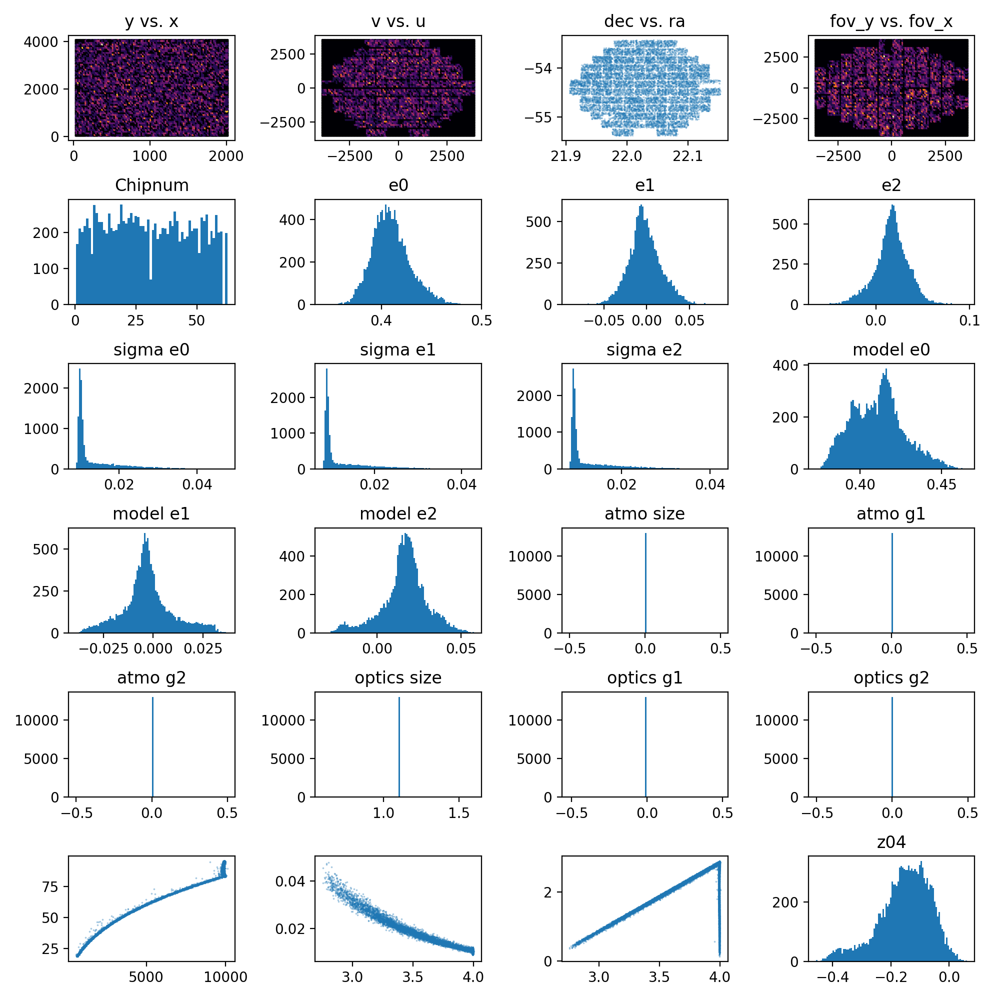

In [30]:
# basic plots of quantities in the h5 file
f,axa = plt.subplots(6,4,figsize=(10,10))
ax = axa.flatten()

ax[0].hexbin(t['x'][:],t['y'][:],gridsize=100, cmap='inferno')
ax[0].set_title('y vs. x')
ax[1].hexbin(t['u'][:],t['v'][:],gridsize=100, cmap='inferno') 
ax[1].set_title('v vs. u')
ax[2].scatter(t['ra'][:],t['dec'][:],marker='.',s=0.05)
ax[2].set_title('dec vs. ra')
ax[3].hexbin(fov_x,fov_y,gridsize=100, cmap='inferno') 
ax[3].set_title('fov_y vs. fov_x')
ax[4].hist(t['chipnum'][:],bins=62,range=(0.5,62.5))
ax[4].set_title('Chipnum')
ax[5].hist(t['data_e0'][:],bins=100)
ax[5].set_title('e0')
ax[6].hist(t['data_e1'][:],bins=100)
ax[6].set_title('e1')
ax[7].hist(t['data_e2'][:],bins=100)
ax[7].set_title('e2')
ax[8].hist(t['data_sigma_e0'][:],bins=100)
ax[8].set_title('sigma e0')
ax[9].hist(t['data_sigma_e1'][:],bins=100)
ax[9].set_title('sigma e1')
ax[10].hist(t['data_sigma_e2'][:],bins=100)
ax[10].set_title('sigma e2')
ax[11].hist(t['model_e0'][:],bins=100)
ax[11].set_title('model e0')
ax[12].hist(t['model_e1'][:],bins=100)
ax[12].set_title('model e1')
ax[13].hist(t['model_e2'][:],bins=100)
ax[13].set_title('model e2')
ax[14].hist(t['atmo_size'][:],bins=100)
ax[14].set_title('atmo size')
ax[15].hist(t['atmo_g1'][:],bins=100)
ax[15].set_title('atmo g1')
ax[16].hist(t['atmo_g2'][:],bins=100)
ax[16].set_title('atmo g2')
ax[17].hist(t['optics_size'][:],bins=100)
ax[17].set_title('optics size')
ax[18].hist(t['optics_g1'][:],bins=100)
ax[18].set_title('optics g1')
ax[19].hist(t['optics_g2'][:],bins=100)
ax[19].set_title('optics g2')
ax[20].scatter(t['data_flux'],t['snr'],marker='.',s=0.1)
ax[21].scatter(np.log10(t['data_flux']),t['data_sigma_e0'],marker='.',s=0.1)
ax[22].scatter(np.log10(t['data_flux']),np.log10(t['model_flux']),marker='.',s=0.1)
ax[23].hist(t['z04'][:],bins=100)
ax[23].set_title('z04')
plt.tight_layout()



In [31]:
def mkPlots(df):
    f,ax = plt.subplots(8,4,squeeze=True,figsize=(18,25))

    varlist = ['e0','e1','e2','zeta1','zeta2','delta1','delta2','orth4']
    for i,avar in enumerate(varlist):
        h = ax[i,0].hist(df['d%s' % (avar)],bins=100)
        h = ax[i,1].hist(df['d%s' % (avar)]/df['data_sigma_%s' % (avar)],bins=100)
        h = ax[i,2].scatter(df['snr'],df['d%s' % (avar)]/df['data_sigma_%s' % (avar)],marker='.',s=0.1)
        h = ax[i,3].scatter(df['data_%s' % (avar)],df['model_%s' % (avar)],marker='.',s=0.1)
        ax[i,3].set_xlabel('data_%s' % (avar))
        ax[i,3].set_ylabel('model_%s' % (avar))

        ax[i,1].set_xlabel(avar)

    

<IPython.core.display.Javascript object>


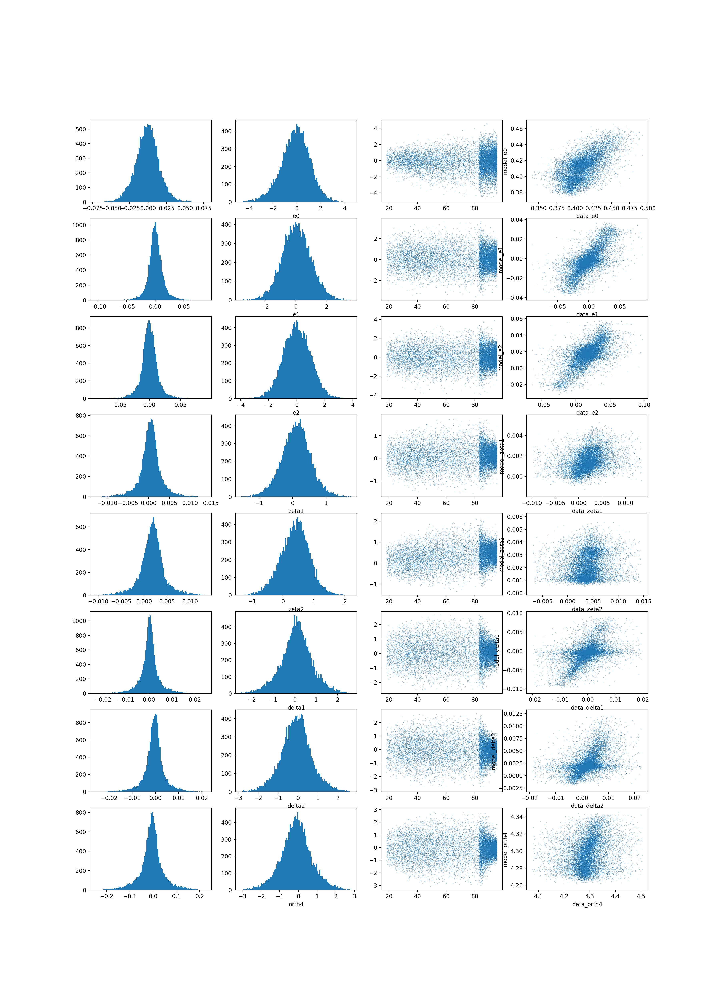

In [32]:
mkPlots(shapes_train)


<IPython.core.display.Javascript object>


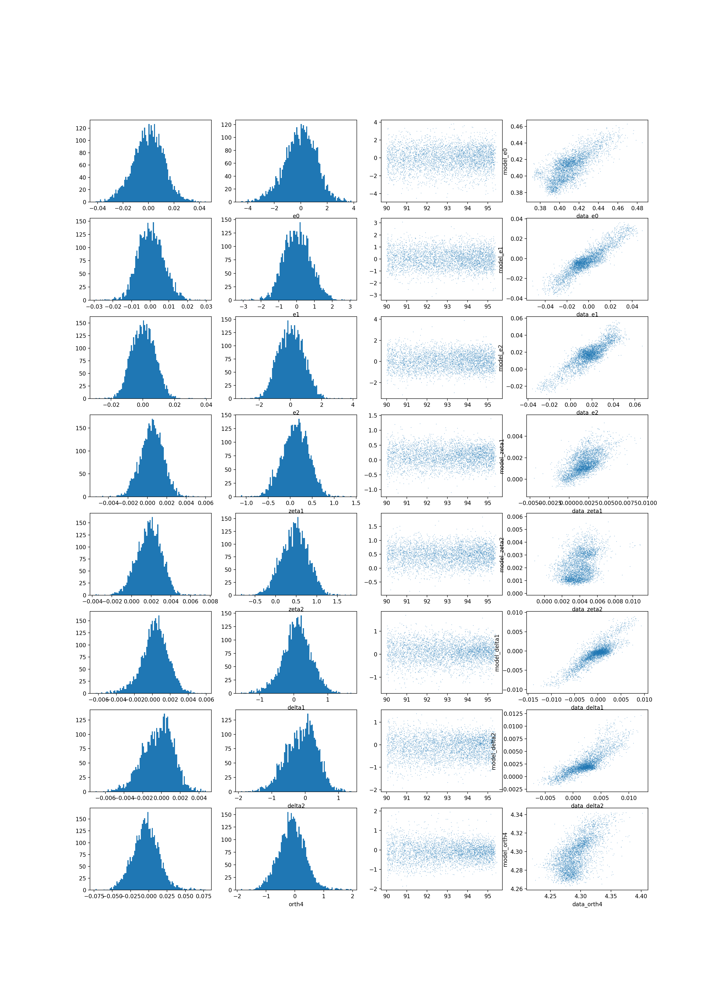

In [33]:
# only brighter stars
df_brighter = shapes_train[shapes_train['snr']>90.]
mkPlots(df_brighter)



<IPython.core.display.Javascript object>


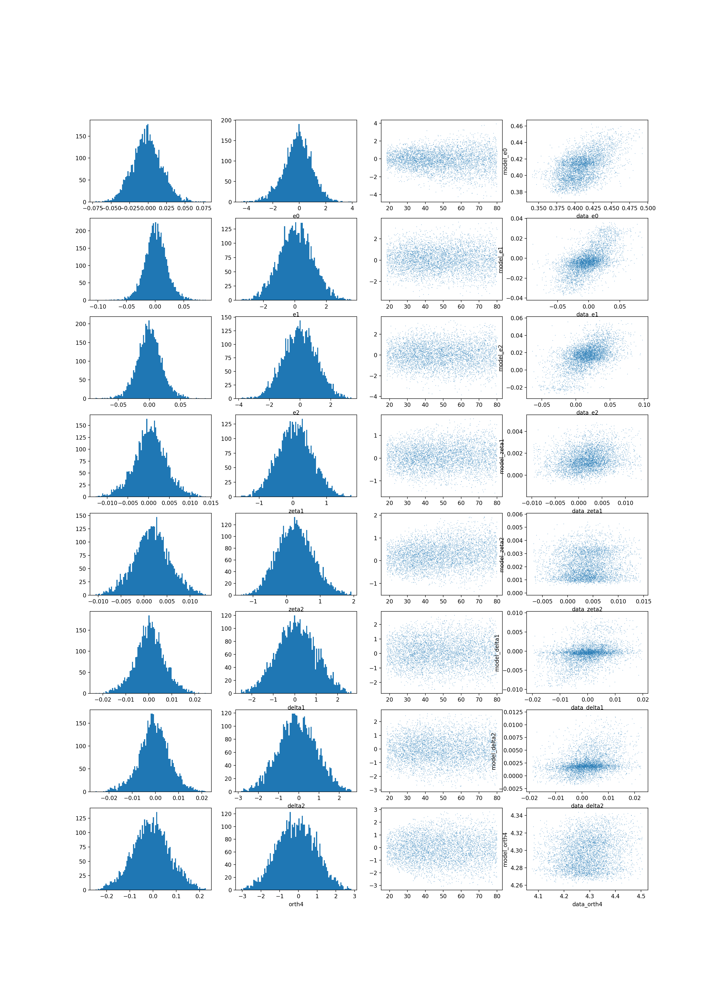

In [34]:
# only dimmer stars
df_dimmer = shapes_train[shapes_train['snr']<80.]
mkPlots(df_dimmer)